In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
from functions import load_and_clean_data
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
import geopandas as gpd
import folium
from folium import plugins

In [2]:
# Cargar el archivo crudo
df_raw = pd.read_csv('data/raw/owid-energy-data.csv')

df_cleaned = df_raw.copy()

# Rellenar valores nulos si es necesario
df_cleaned.fillna(0, inplace=True)  # Este es solo un ejemplo, ajusta según la lógica de tu limpieza

# Guardar el archivo limpio
df_cleaned.to_csv('data/clean/cleaned_data_final.csv', index=False)

print("Archivo limpio guardado")


Archivo limpio guardado


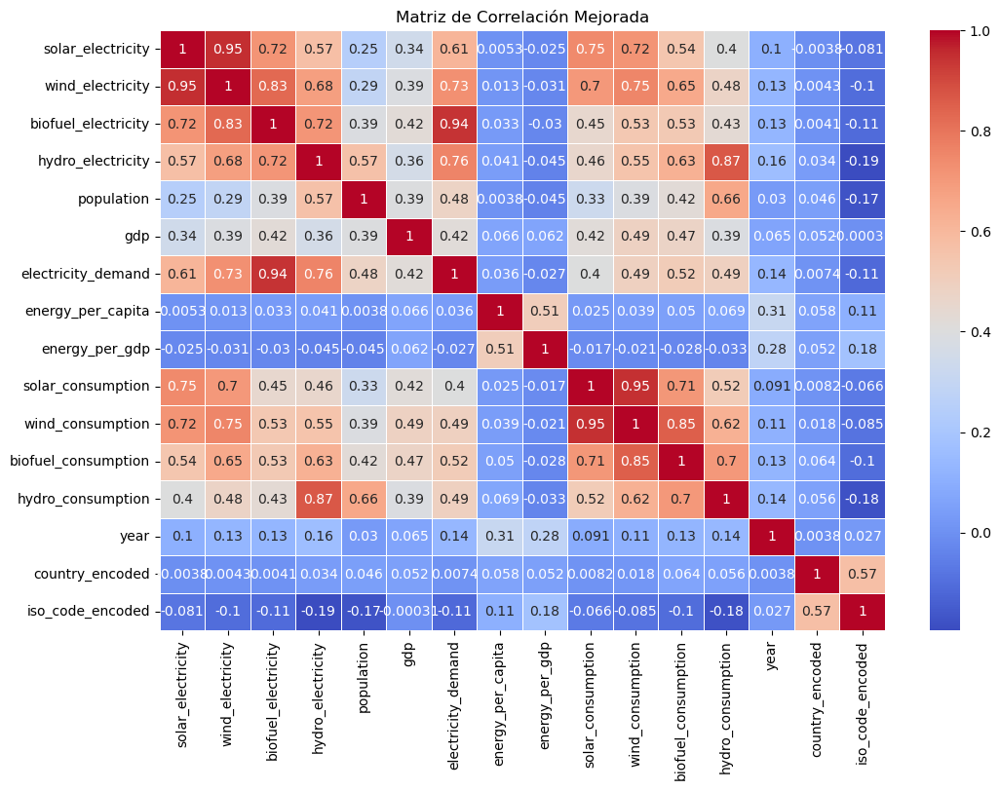

In [3]:
# Cargar los datos limpios
df = pd.read_csv('data/clean/cleaned_data_final.csv')

# Seleccionar solo las columnas más relevantes
columns_to_keep = [
    'solar_electricity', 'wind_electricity', 'biofuel_electricity', 'hydro_electricity',
    'population', 'gdp', 'electricity_demand', 'energy_per_capita', 'energy_per_gdp',
    'solar_consumption', 'wind_consumption', 'biofuel_consumption', 'hydro_consumption',
    'country', 'iso_code', 'year'  # Ejemplo de columnas categóricas
]

df_filtered = df[columns_to_keep]

# Aplicar Label Encoding a las columnas categóricas (si es necesario)
le = LabelEncoder()
df_filtered['country_encoded'] = le.fit_transform(df_filtered['country'])
df_filtered['iso_code_encoded'] = le.fit_transform(df_filtered['iso_code'])

# Eliminar las columnas originales categóricas si ya no son necesarias
df_filtered = df_filtered.drop(columns=['country', 'iso_code'])

# Generar la matriz de correlación
corr_matrix = df_filtered.corr()

# Crear un heatmap de correlación
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Matriz de Correlación Mejorada")
plt.show()

<Figure size 1500x1000 with 0 Axes>

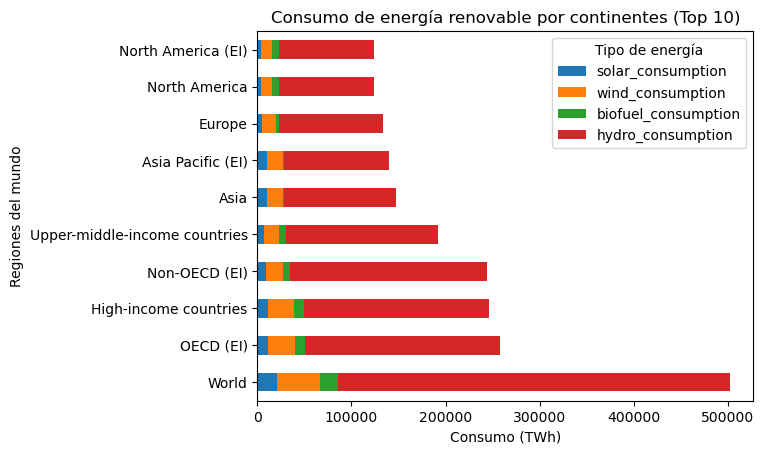

In [4]:
# Columnas de consumo
consumo_columns = ['solar_consumption', 'wind_consumption', 'biofuel_consumption', 'hydro_consumption']

# Sumar el consumo por país
df_consumo = df.groupby('country')[consumo_columns].sum().reset_index()

# Calcular el consumo total de energía para cada país
df_consumo['total_consumption'] = df_consumo[consumo_columns].sum(axis=1)

# Filtrar los países con mayor consumo total (por ejemplo, los 10 primeros)
df_top_countries = df_consumo.nlargest(10, 'total_consumption')

# Estilo: Gráfico de Barras Horizontales
plt.figure(figsize=(15, 10))
df_top_countries.set_index('country')[consumo_columns].plot(kind='barh', stacked=True)
plt.title('Consumo de energía renovable por continentes (Top 10)')
plt.xlabel('Consumo (TWh)')
plt.ylabel('Regiones del mundo')
plt.legend(title='Tipo de energía')
plt.show()


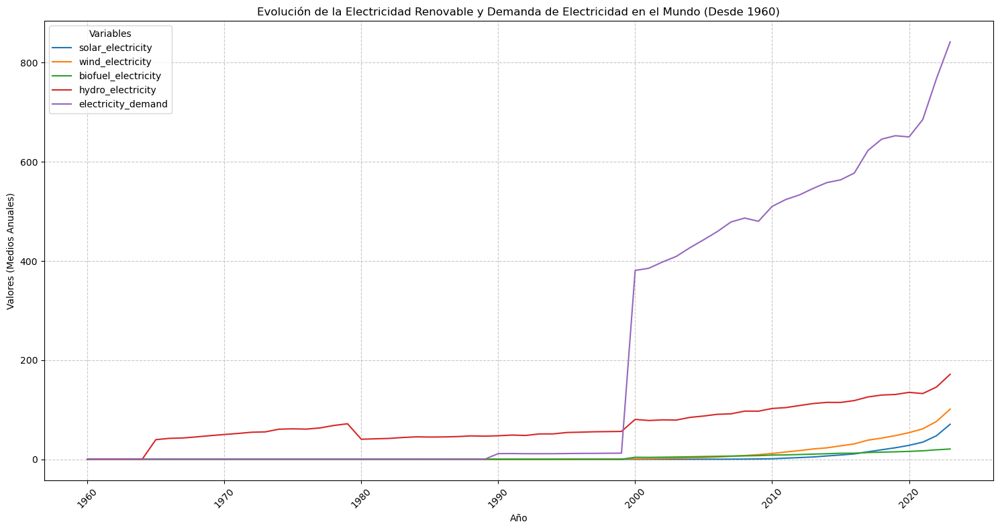

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar los datos limpios
df = pd.read_csv('data/clean/cleaned_data_final.csv')

# Definir las columnas a graficar
columns_to_plot = [
    'solar_electricity', 
    'wind_electricity', 
    'biofuel_electricity', 
    'hydro_electricity',
    'electricity_demand'
]

# Filtrar los datos a partir de 1960
df_filtered = df[df['year'] >= 1960]

# Agrupar por año y calcular la media
df_plot_grouped = df_filtered.groupby('year')[columns_to_plot].mean().reset_index()

# Gráfica de líneas
plt.figure(figsize=(15, 8))
for column in columns_to_plot:
    plt.plot(df_plot_grouped['year'], df_plot_grouped[column], label=column)

# Mejorar la visualización
plt.title('Evolución de la Electricidad Renovable y Demanda de Electricidad en el Mundo (Desde 1960)')
plt.xlabel('Año')
plt.ylabel('Valores (Medios Anuales)')  # Especificar que son valores medios anuales
plt.xticks(rotation=45)  # Rotar las etiquetas del eje x para mejor legibilidad
plt.yticks(fontsize=10)  # Ajustar el tamaño de las etiquetas del eje y
plt.legend(title='Variables', fontsize=10)  # Título para la leyenda
plt.grid(True, linestyle='--', alpha=0.7)  # Mejorar la visualización de la cuadrícula

plt.tight_layout()  # Ajustar el layout para que no se superpongan los elementos
plt.show()


In [6]:
# Agrupar y calcular la media para las columnas deseadas
df_grouped = df_filtered.groupby(['country'])[columns_to_plot].mean().reset_index()

# Reemplazar "United States" por "United States of America"
df_grouped['country'] = df_grouped['country'].replace('United States', 'United States of America')

# Cargar el shapefile del mundo
world = gpd.read_file('shapefiles/ne_110m_admin_0_countries.shp')

# Unir el DataFrame con el mapa utilizando la columna 'ADMIN'
world = world.merge(df_grouped, how="left", left_on="ADMIN", right_on="country")

# Crear un mapa base
m = folium.Map(location=[20, 0], zoom_start=2)

# Añadir capas para cada tipo de energía
for column in columns_to_plot:
    # Definir la escala de colores basada en los valores únicos de cada columna
    folium.Choropleth(
        geo_data=world,
        name=column,
        data=df_grouped,
        columns=['country', column],
        key_on='feature.properties.ADMIN',
        fill_color='YlGn',  # Cambiar a otros esquemas de color si es necesario
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Average {column.replace("_", " ").title()}',  # Leyenda dinámica
        missing_kwds={"color": "lightgrey", "label": "No data"},
        # Aquí agregamos el rango para el color
        threshold_scale=df_grouped[column].quantile([0, 0.25, 0.5, 0.75, 1]).tolist()
    ).add_to(m)

# Añadir controles de capas
folium.LayerControl().add_to(m)

# Mostrar el mapa
m.save('interactive_energy_world_map.html')
m


In [7]:
list_of_european_countries = [
    'Germany', 'France', 'United Kingdom', 'Italy', 'Spain', 'Netherlands', 
    'Belgium', 'Sweden', 'Austria', 'Denmark', 'Finland', 'Norway', 'Poland', 
    'Portugal', 'Czech Republic', 'Hungary', 'Greece', 'Ireland', 'Romania', 
    'Switzerland', 'Bulgaria', 'Slovakia', 'Croatia', 'Lithuania', 'Slovenia', 
    'Latvia', 'Estonia', 'Cyprus', 'Malta'
]

# Filtrar el GeoDataFrame para obtener solo Europa y Estados Unidos
eu_df = world[world['NAME'].isin(['Europe'] + list_of_european_countries)]


# Crear un mapa base centrado en Europa
m = folium.Map(location=[50, 10], zoom_start=4)

# Añadir el Choropleth para Europa y Estados Unidos
for column in columns_to_plot:
    folium.Choropleth(
        geo_data=eu_df,
        name=column,
        data=eu_df,
        columns=['country', column],
        key_on='feature.properties.NAME',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=f'Average {column.replace("_", " ").title()}',
        missing_kwds={"color": "lightgrey", "label": "No data"},
    ).add_to(m)

# Añadir controles de capas
folium.LayerControl().add_to(m)

# Mostrar el mapa
m.save('eu_energy_map.html')
m



In [13]:
df = pd.read_csv('data/clean/cleaned_data_final.csv')

df.columns

Index(['country', 'year', 'iso_code', 'population', 'gdp',
       'biofuel_cons_change_pct', 'biofuel_cons_change_twh',
       'biofuel_cons_per_capita', 'biofuel_consumption',
       'biofuel_elec_per_capita',
       ...
       'solar_share_elec', 'solar_share_energy', 'wind_cons_change_pct',
       'wind_cons_change_twh', 'wind_consumption', 'wind_elec_per_capita',
       'wind_electricity', 'wind_energy_per_capita', 'wind_share_elec',
       'wind_share_energy'],
      dtype='object', length=129)

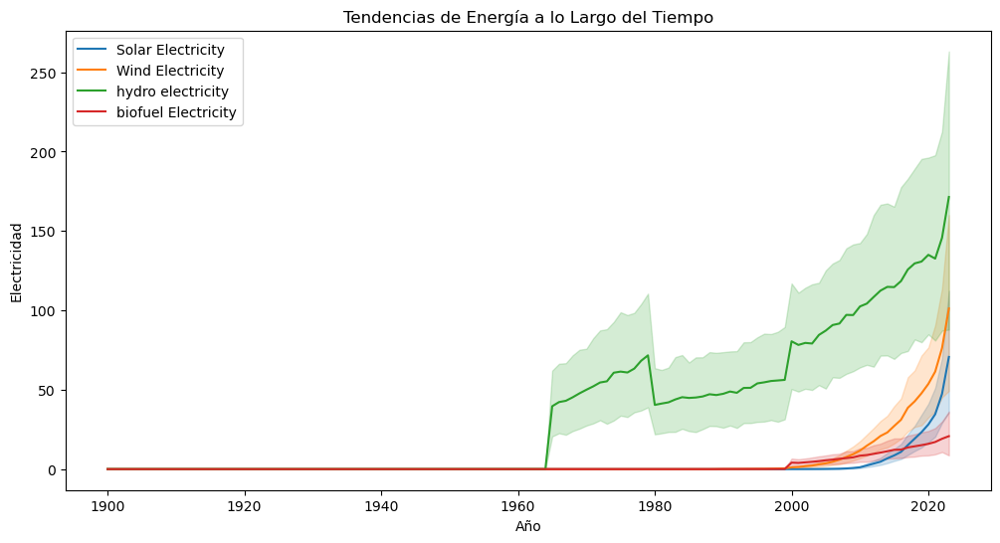

In [5]:
import pandas as
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('data/clean/cleaned_data_final.csv')

# Tendencias de energía a lo largo del tiempo
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='year', y='solar_electricity', label='Solar Electricity')
sns.lineplot(data=df, x='year', y='wind_electricity', label='Wind Electricity')
sns.lineplot(data=df, x='year', y='hydro_electricity', label='hydro electricity')
sns.lineplot(data=df, x='year', y='biofuel_electricity', label='biofuel Electricity')
plt.title('Tendencias de Energía a lo Largo del Tiempo')
plt.xlabel('Año')
plt.ylabel('Electricidad')
plt.legend()
plt.show()

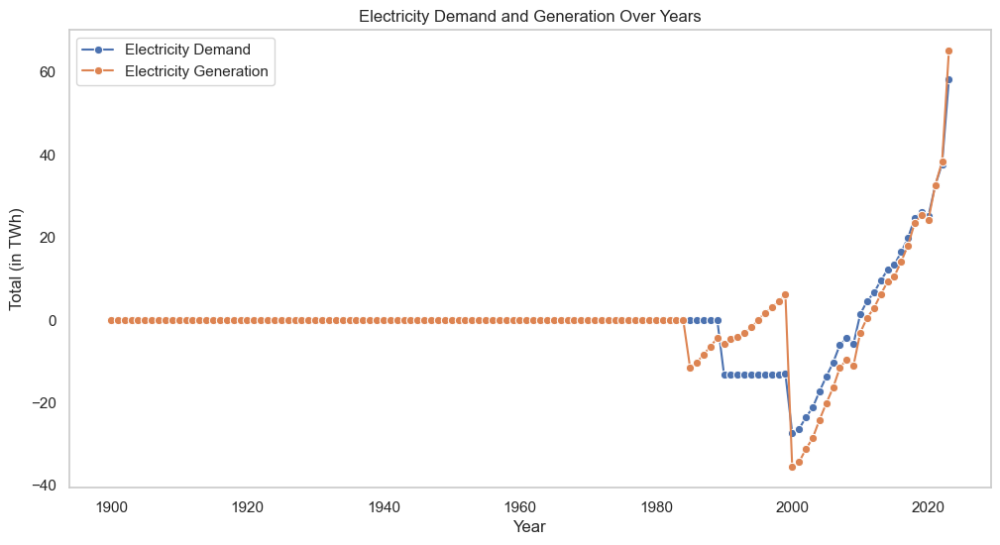

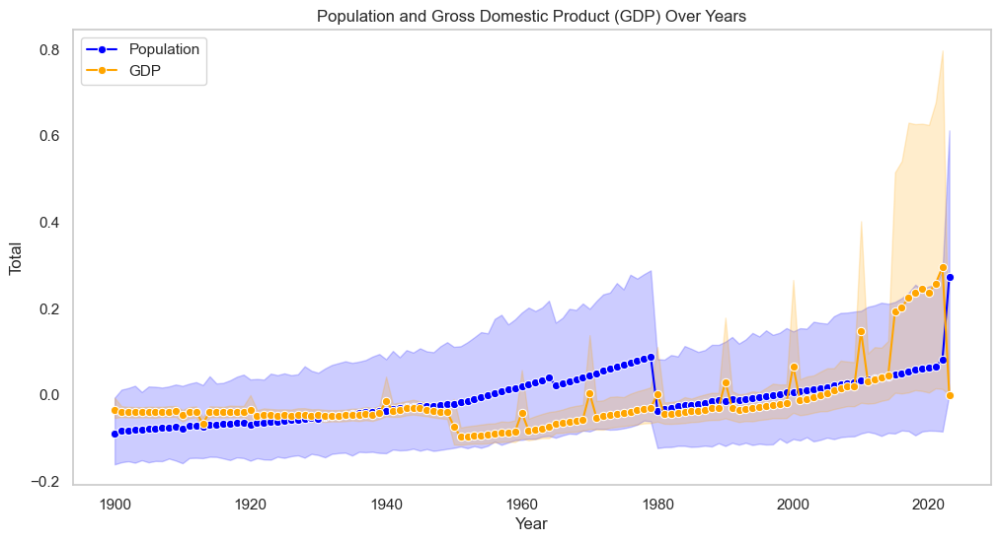

In [10]:
columns_of_interest = [
    'year', 'country', 'iso_code', 'population', 'gdp', 
    'electricity_demand', 'electricity_generation', 'electricity_share_energy',
    'energy_cons_change_twh', 'energy_per_capita', 'energy_per_gdp', 
    'solar_consumption', 'wind_consumption', 'biofuel_consumption', 
    'solar_cons_change_twh', 'wind_cons_change_twh', 
    'biofuel_cons_change_pct', 'solar_share_elec', 'wind_share_elec'
]

# Filtrar el DataFrame
filtered_data = df[columns_of_interest]

# Cargar los datos
data = pd.read_csv('data/clean/cleaned_data.csv')

# Establecer el estilo de seaborn
sns.set(style='whitegrid')

# 1. Gráfico de Barras de la Demanda y Generación de Electricidad por Año
filtered_data = data[['year', 'electricity_demand', 'electricity_generation']]
yearly_data = filtered_data.groupby('year').sum().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=yearly_data, x='year', y='electricity_demand', label='Electricity Demand', marker='o')
sns.lineplot(data=yearly_data, x='year', y='electricity_generation', label='Electricity Generation', marker='o')
plt.title('Electricity Demand and Generation Over Years')
plt.xlabel('Year')
plt.ylabel('Total (in TWh)')
plt.legend()
plt.grid()
plt.show()


# Establecer el estilo de seaborn
sns.set(style='whitegrid')

# 1. Gráfico de Línea de Población y PIB a lo Largo de los Años
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='year', y='population', label='Population', color='blue', marker='o')
sns.lineplot(data=data, x='year', y='gdp', label='GDP', color='orange', marker='o')
plt.title('Population and Gross Domestic Product (GDP) Over Years')
plt.xlabel('Year')
plt.ylabel('Total')
plt.legend()
plt.grid()
plt.show()
